<a href="https://colab.research.google.com/github/ricky-kiva/dl-deep-tf-cv-advanced/blob/main/2_l3_tf_api_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Object Detection API**

Import specific version of packages

**Note:** `protobuf` used for serializing & deserializing structured data

In [1]:
!pip install protobuf==3.20.3

Import packages

In [12]:
import time
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

Set Matplotlib to `inline` mode

In [23]:
%matplotlib inline

Clone Tensorflow Object Detection API repository

**Note:**
- `!git`: `!` used to run shell command `git`
- `clone`: copy remote repository on this machine
- `--depth 1`: clone only the latest repository

In [3]:
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4067, done.
remote: Counting objects: 100% (4067/4067), done.
remote: Compressing objects: 100% (3044/3044), done.
remote: Total 4067 (delta 1179), reused 2917 (delta 963), pack-reused 0
Receiving objects: 100% (4067/4067), 44.58 MiB | 27.22 MiB/s, done.
Resolving deltas: 100% (1179/1179), done.


Install the **Tensorflow Object Detection API**

**Note:**
- **After executing these bash commands**, you will get `build` & `object_detection.egg-info` dir. inside `model/research`
- `sudo apt install -y protobuf-compiler`:
  - `sudo`: executes command with superuser privileges
  - `apt`: Advanced Package Tool. For package management on `Debian`-based systems
  - `install -y protobuf-compiler`: installs `protobuf-compiler` package for Protocol Buffers compilation
    - `-y`: automatically answer *yes* to prompts, make the installation non-interactice
    - `protobuf-compiler`: tools to compile `.proto` files from TensorFlow Object Detection API to Python files
- `cd models/research/`: change **current** working directory to `models/research`
- `protoc object_detection/protos/*.proto`:
  - `protoc`: Protocol Buffers compiler command
  - `object_detection/protos/*.proto`: specifies input Protocol Buffers files (`.proto`) inside `object_detection/protos` directory
  - `--python_out=.`: output the compiled Python files in current directory (`.`)
- `cp object_detection/packages/tf2/setup.py .`:
  - `cp`: copy files / directories
  - `object_detection/packages/tf2/setup.py`: specifies source path of `setup.py` file
  - `.`: specify *current directory* as destination path
- `python -m pip install .`:
  - `python`: invoke Python interpreter
  - `-m pip`: run `pip` module *as a script*
  - `install .`: search `setup.py` inside *current directory* (`.`)
    - `setup.py` contains information about the package (name, version, dependencies, etc). `pip` uses the information inside `setup.py` to install the package according to the specification

In [4]:
%%bash
sudo apt install -y protobuf-compiler # tools to compile `.proto` files from TensorFlow Object Detection API to Python files
cd models/research/ # change current working directory
protoc object_detection/protos/*.proto --python_out=. # execute Protocol Buffer on specified `.proto`, and outputs to current working directory (`.`)
cp object_detection/packages/tf2/setup.py . # copy `setup.py` from cloned repo. to current working directory (`.`)
python -m pip install . # install `setup.py` by `pip` according to the configuration inside it

Reading package lists...
Building dependency tree...
Reading state information...
protobuf-compiler is already the newest version (3.12.4-1ubuntu7.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 32 not upgraded.
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 38.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 47.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 MB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing met

Import installed dependencies

**Note:** These dependencies are from `models/research/build/lib/object_detection/utils` after installing the package

In [5]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

Load label map data (convert integer CNN prediction to corresponding label)

In [6]:
PATH_TO_LABELS = './models/research/object_detection/data/mscoco_label_map.pbtxt'

# `use_display_name`: use display name instead of name in the `.pbtxt`
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

Function: Load image into numpy array

In [7]:
from six import BytesIO
from six.moves.urllib.request import urlopen
from PIL import Image, ImageDraw, ImageFont

def load_image_into_numpy_array(path):
  image = None

  if (path.startswith('http')):
    response = urlopen(path) # opens given url
    img_data = response.read() # reads image fetched from URL
    img_data = BytesIO(img_data) # puts image data to memory buffer
    img = Image.open(img_data) # open image using PIL
  else:
    img_data = tf.io.gfile.GFile(path, 'rb').read() # read file in binary mode
    img = Image.open(BytesIO(img_data))

  (im_width, im_height) = img.size # get image width & height

  # `.getdata()`: get pixel values of the image (`img`)
  return np.array(img.getdata()).reshape(
      (1, im_height, im_width, 3)).astype(np.uint8)

Set constants for models, test images, & human pose keypoints data

In [8]:
ALL_MODELS = {
'CenterNet HourGlass104 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512/1',
'CenterNet HourGlass104 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/hourglass_512x512_kpts/1',
'CenterNet HourGlass104 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024/1',
'CenterNet HourGlass104 Keypoints 1024x1024' : 'https://tfhub.dev/tensorflow/centernet/hourglass_1024x1024_kpts/1',
'CenterNet Resnet50 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512/1',
'CenterNet Resnet50 V1 FPN Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v1_fpn_512x512_kpts/1',
'CenterNet Resnet101 V1 FPN 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet101v1_fpn_512x512/1',
'CenterNet Resnet50 V2 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512/1',
'CenterNet Resnet50 V2 Keypoints 512x512' : 'https://tfhub.dev/tensorflow/centernet/resnet50v2_512x512_kpts/1',
'EfficientDet D0 512x512' : 'https://tfhub.dev/tensorflow/efficientdet/d0/1',
'EfficientDet D1 640x640' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'EfficientDet D2 768x768' : 'https://tfhub.dev/tensorflow/efficientdet/d2/1',
'EfficientDet D3 896x896' : 'https://tfhub.dev/tensorflow/efficientdet/d3/1',
'EfficientDet D4 1024x1024' : 'https://tfhub.dev/tensorflow/efficientdet/d4/1',
'EfficientDet D5 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d5/1',
'EfficientDet D6 1280x1280' : 'https://tfhub.dev/tensorflow/efficientdet/d6/1',
'EfficientDet D7 1536x1536' : 'https://tfhub.dev/tensorflow/efficientdet/d7/1',
'SSD MobileNet v2 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2',
'SSD MobileNet V1 FPN 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD MobileNet V2 FPNLite 320x320' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_320x320/1',
'SSD MobileNet V2 FPNLite 640x640' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/fpnlite_640x640/1',
'SSD ResNet50 V1 FPN 640x640 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_640x640/1',
'SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)' : 'https://tfhub.dev/tensorflow/retinanet/resnet50_v1_fpn_1024x1024/1',
'SSD ResNet101 V1 FPN 640x640 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_640x640/1',
'SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)' : 'https://tfhub.dev/tensorflow/retinanet/resnet101_v1_fpn_1024x1024/1',
'SSD ResNet152 V1 FPN 640x640 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_1024x1024/1',
'Faster R-CNN ResNet50 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_640x640/1',
'Faster R-CNN ResNet50 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_1024x1024/1',
'Faster R-CNN ResNet50 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet50_v1_800x1333/1',
'Faster R-CNN ResNet101 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_640x640/1',
'Faster R-CNN ResNet101 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_1024x1024/1',
'Faster R-CNN ResNet101 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet101_v1_800x1333/1',
'Faster R-CNN ResNet152 V1 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1',
'Faster R-CNN ResNet152 V1 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_1024x1024/1',
'Faster R-CNN ResNet152 V1 800x1333' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_800x1333/1',
'Faster R-CNN Inception ResNet V2 640x640' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_640x640/1',
'Faster R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/faster_rcnn/inception_resnet_v2_1024x1024/1',
'Mask R-CNN Inception ResNet V2 1024x1024' : 'https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1'
}

IMAGES_FOR_TEST = {
  'Beach' : 'models/research/object_detection/test_images/image2.jpg',
  'Dogs' : 'models/research/object_detection/test_images/image1.jpg',
  'Naxos Taverna' : 'https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg',
  'Beatles' : 'https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg',
  'Phones' : 'https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg',
  'Birds' : 'https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg',
}

COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1), (0, 2), (1, 3), (2, 4), (0, 5), (0, 6), (5, 7), (7, 9), (6, 8), (8, 10), (5, 6), (5, 11), (6, 12), (11, 12), (11, 13), (13, 15), (12, 14), (14, 16)]

Model selection

In [30]:
#@title Model Selection { display-mode: "form", run: "auto" }
model_display_name = 'Mask R-CNN Inception ResNet V2 1024x1024' # @param ['CenterNet HourGlass104 512x512','CenterNet HourGlass104 Keypoints 512x512','CenterNet HourGlass104 1024x1024','CenterNet HourGlass104 Keypoints 1024x1024','CenterNet Resnet50 V1 FPN 512x512','CenterNet Resnet50 V1 FPN Keypoints 512x512','CenterNet Resnet101 V1 FPN 512x512','CenterNet Resnet50 V2 512x512','CenterNet Resnet50 V2 Keypoints 512x512','EfficientDet D0 512x512','EfficientDet D1 640x640','EfficientDet D2 768x768','EfficientDet D3 896x896','EfficientDet D4 1024x1024','EfficientDet D5 1280x1280','EfficientDet D6 1280x1280','EfficientDet D7 1536x1536','SSD MobileNet v2 320x320','SSD MobileNet V1 FPN 640x640','SSD MobileNet V2 FPNLite 320x320','SSD MobileNet V2 FPNLite 640x640','SSD ResNet50 V1 FPN 640x640 (RetinaNet50)','SSD ResNet50 V1 FPN 1024x1024 (RetinaNet50)','SSD ResNet101 V1 FPN 640x640 (RetinaNet101)','SSD ResNet101 V1 FPN 1024x1024 (RetinaNet101)','SSD ResNet152 V1 FPN 640x640 (RetinaNet152)','SSD ResNet152 V1 FPN 1024x1024 (RetinaNet152)','Faster R-CNN ResNet50 V1 640x640','Faster R-CNN ResNet50 V1 1024x1024','Faster R-CNN ResNet50 V1 800x1333','Faster R-CNN ResNet101 V1 640x640','Faster R-CNN ResNet101 V1 1024x1024','Faster R-CNN ResNet101 V1 800x1333','Faster R-CNN ResNet152 V1 640x640','Faster R-CNN ResNet152 V1 1024x1024','Faster R-CNN ResNet152 V1 800x1333','Faster R-CNN Inception ResNet V2 640x640','Faster R-CNN Inception ResNet V2 1024x1024','Mask R-CNN Inception ResNet V2 1024x1024']
model_handle = ALL_MODELS[model_display_name]

print('Selected model:'+ model_display_name)
print(f"Model Handle at TensorFlow Hub: {model_handle}")

Selected model:Mask R-CNN Inception ResNet V2 1024x1024
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/mask_rcnn/inception_resnet_v2_1024x1024/1


Load selected model from Tensorflow Hub

In [31]:
print('loading model..')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model..
model loaded!


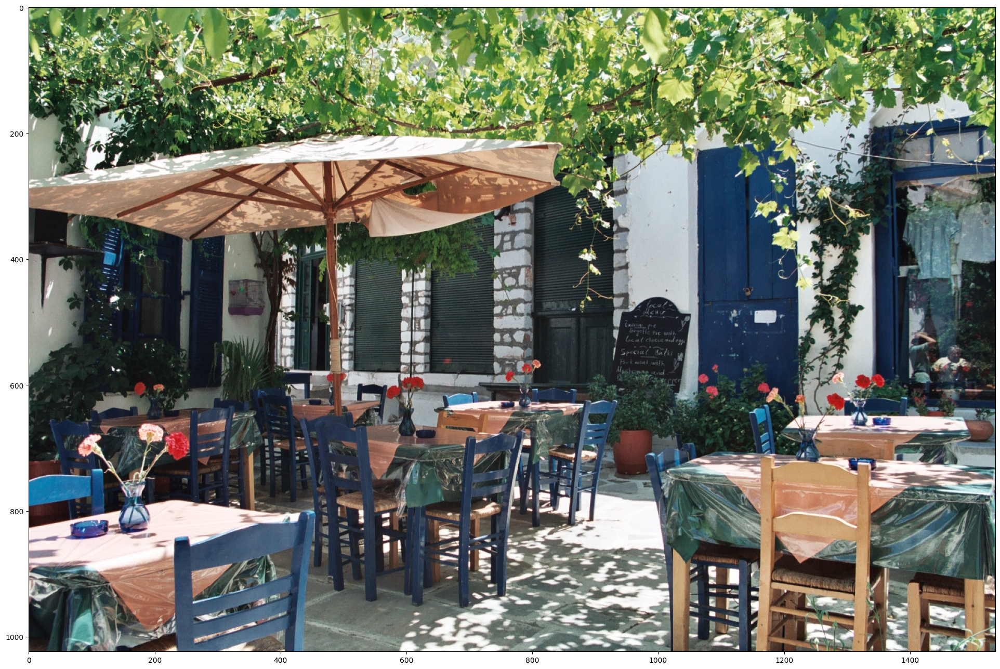

In [32]:
#@title Image Selection { display-mode: "form"}
selected_image = 'Naxos Taverna' # @param ['Beach', 'Dogs', 'Naxos Taverna', 'Beatles', 'Phones', 'Birds']
flip_image_horizontally = False #@param {type:"boolean"}
convert_image_to_grayscale = False #@param {type:"boolean"}

image_path = IMAGES_FOR_TEST[selected_image]
image_np = load_image_into_numpy_array(image_path)

# flip horizontally
if flip_image_horizontally:
  # use `copy()` not to modify the original image
  image_np[0] = np.fliplr(image_np[0]).copy()

# convert image to grayscale
if convert_image_to_grayscale:
  # NOT using `copy()` because `np.tile` creates new array
  # `np.mean()`: calculate mean of specified array on the 3rd axis (param: 2) (dimension), which is channel
  # - `keepdims`: if False, will banish the last dimension
  # `np.tile()`: replicates the `mean` values before, along specified dimension
  # - (1, 1, 3): replicates on the last dimension 3x
  image_np[0] = np.tile(np.mean(image_np[0], 2, keepdims=True),
                        (1, 1, 3)).astype(np.uint8)

plt.figure(figsize=(24, 32))
plt.imshow(image_np[0])
plt.show()

Run inference using the model

In [33]:
results = hub_model(image_np)

# save results in dictionary
result = {key:value.numpy() for key, value in results.items()}

# display types of outputs
print(result.keys())

dict_keys(['proposal_boxes_normalized', 'detection_anchor_indices', 'proposal_boxes', 'box_classifier_features', 'class_predictions_with_background', 'detection_masks', 'mask_predictions', 'rpn_box_predictor_features', 'detection_boxes', 'num_proposals', 'rpn_objectness_predictions_with_background', 'detection_classes', 'rpn_features_to_crop', 'rpn_box_encodings', 'final_anchors', 'raw_detection_scores', 'detection_multiclass_scores', 'image_shape', 'num_detections', 'refined_box_encodings', 'anchors', 'raw_detection_boxes', 'detection_scores'])


Visualizing the results using Tensorflow Object Detection API

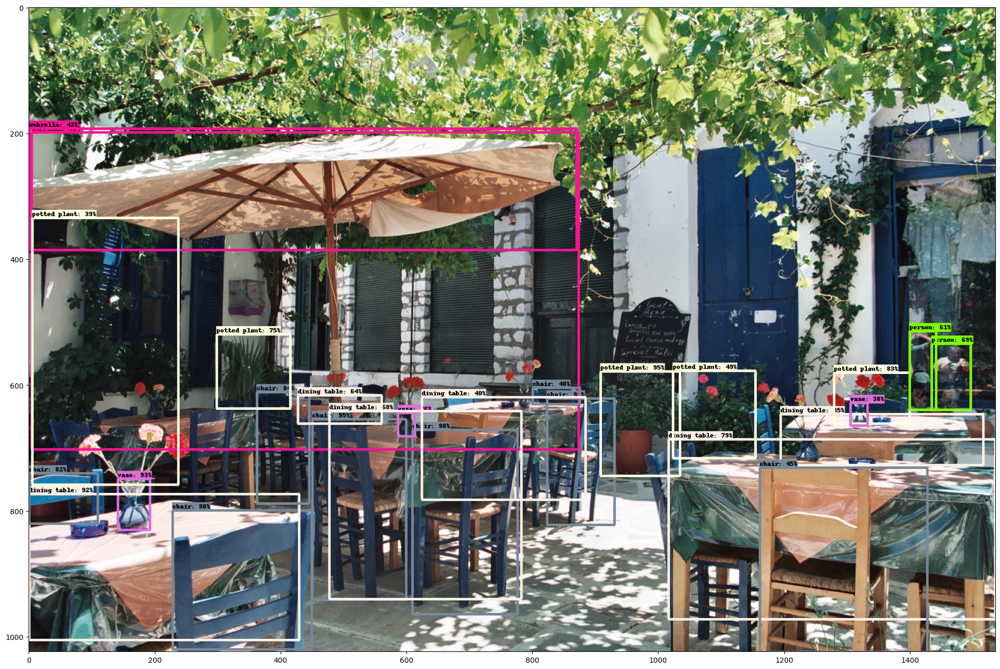

In [34]:
# where the `id` starts in the `.pbtxt` file (the smallest id)
label_id_offset = 0

# make a copy of the image
image_np_with_detections = image_np.copy()

# use keypoints if available (like in pose detection)
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in result:
  keypoints = result['detection_keypoints'][0]
  keypoint_scores = result['detection_keypoint_scores'][0]

# visualize using TF Obj. Detect. API
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=100,
      min_score_thresh=.30,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=COCO17_HUMAN_POSE_KEYPOINTS)

plt.figure(figsize=(24, 32))
plt.imshow(image_np_with_detections[0])
plt.show()

[Optional] **Image Segmentation** Visualization

**Note:** example model, `Mask R-CNN`

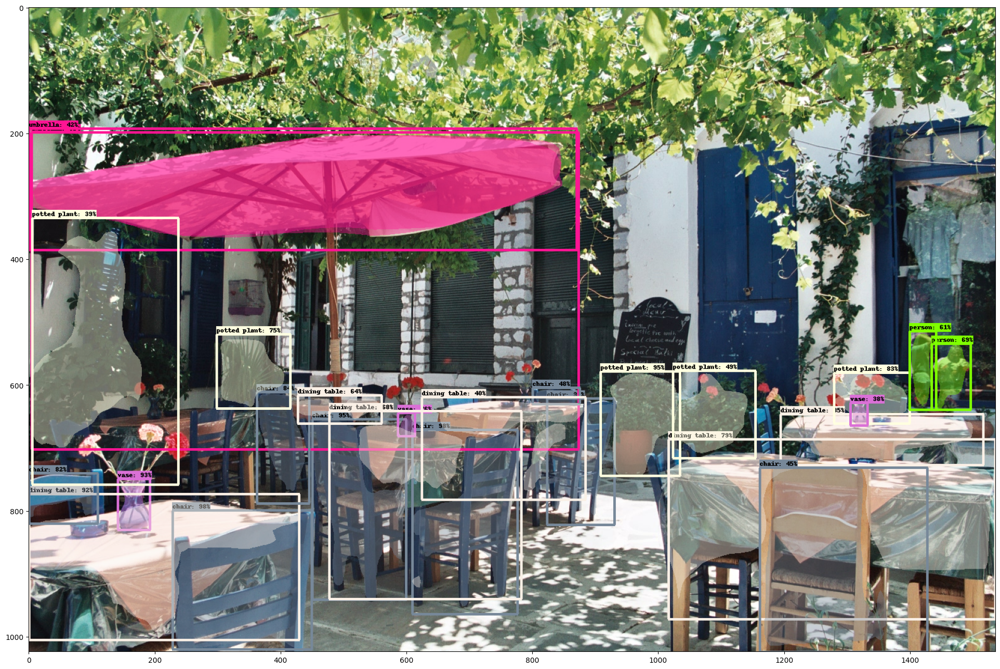

In [43]:
# make a copy of the image
image_np_with_mask = image_np.copy()

if 'detection_masks' in result:
  # convert np.arrays to tensors. necessary to perform tensor operations on these components
  detection_masks = tf.convert_to_tensor(result['detection_masks'][0])
  detection_boxes = tf.convert_to_tensor(result['detection_boxes'][0])

  # adjust detection masks to the scale of the image
  detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
      detection_masks, detection_boxes, image_np.shape[1], image_np.shape[2])

  # Converts reframed masks to binary (1 for objects, 0 for background) using a 0.5 threshold & casts to 8-bit integers
  detection_masks_reframed = tf.cast((detection_masks_reframed > 0.5), tf.uint8)

  # store processed detection masks to `result` & convert back to numpy
  result['detection_masks_reframed'] = detection_masks_reframed.numpy()

  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_mask[0],
      result['detection_boxes'][0],
      (result['detection_classes'][0] + label_id_offset).astype(int),
      result['detection_scores'][0],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=100,
      min_score_thresh=.30,
      agnostic_mode=False,
      instance_masks=result.get('detection_masks_reframed', None),
      line_thickness=4)

  plt.figure(figsize=(24,32))
  plt.imshow(image_np_with_mask[0])
  plt.show()